About Dataset

       ◼  The Personal Key Indicators of Heart Disease dataset contains 320K rows and 18 columns. It is a cleaned, smaller version of the 2020 annual CDC (Centers for Disease Control and Prevention) survey data of 400k adults. For each patient (row), it contains the health status of that individual. The data was collected in the form of surveys conducted over the phone. Each year, the CDC calls around 400K U.S residents and asks them about their health status, with the vast majority of questions being yes or no questions. Below is a description of the features collected for each patient:


What's imbalance dataset

Class imbalance is a problem that occurs in machine learning classification problems. It merely tells that the target class’s frequency is highly imbalanced, i.e., the occurrence of one of the classes is very high compared to the other classes present. In other words, there is a bias or skewness towards the majority class present in the target. Suppose we consider a binary classification where the majority target class has 10000 rows, and the minority target class has only 100 rows. In that case, the ratio is 100:1, i.e., for every 100 majority class, there is only one minority class present. This problem is what we refer to as class imbalance. Some of the general areas where we can find such data are fraud detection, churn prediction, medical diagnosis, e-mail classification, etc.
We will be working on a dataset from the medical domain to understand class imbalance properly. Here, we have to predict whether a person will have a heart stroke or not based on the given attributes(independent variables).

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#plotly has been used for visualization
import plotly as py
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.express as px




#model
from sklearn.experimental import enable_halving_search_cv
# now you can import normally from model_selection
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.model_selection import (cross_validate, StratifiedKFold, train_test_split,GridSearchCV,
                                    HalvingGridSearchCV)

import warnings
warnings.filterwarnings("ignore")    # (Optional)

print("Project has been created with this version of Pandas: " ,pd. __version__," And with this version of Numpy: ",np. __version__)

Project has been created with this version of Pandas:  1.5.3  And with this version of Numpy:  1.25.2


In [ ]:
data= pd.read_csv(r"/content/heart_2020_cleaned.csv")
df_orginal=pd.DataFrame(data)
df_orginal

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,Yes,27.41,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No
319791,No,29.84,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No
319792,No,24.24,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No
319793,No,32.81,No,No,No,0.0,0.0,No,Female,25-29,Hispanic,No,No,Good,12.0,No,No,No


In [ ]:
df_orginal.describe(include='all')

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
count,319795,319795.000000,319795,319795,319795,319795.00000,319795.000000,319795,319795,319795,319795,319795,319795,319795,319795.000000,319795,319795,319795
unique,2,NaN,2,2,2,NaN,NaN,2,2,13,6,4,2,5,NaN,2,2,2
top,No,NaN,No,No,No,NaN,NaN,No,Female,65-69,White,No,Yes,Very good,NaN,No,No,No
freq,292422,NaN,187887,298018,307726,NaN,NaN,275385,167805,34151,245212,269653,247957,113858,NaN,276923,308016,289976
mean,NaN,28.325399,NaN,NaN,NaN,3.37171,3.898366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.097075,NaN,NaN,NaN
std,NaN,6.356100,NaN,NaN,NaN,7.95085,7.955235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.436007,NaN,NaN,NaN
min,NaN,12.020000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN
25%,NaN,24.030000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,NaN,NaN,NaN
50%,NaN,27.340000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,NaN,NaN
75%,NaN,31.420000,NaN,NaN,NaN,2.00000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.000000,NaN,NaN,NaN


In [ ]:
df_orginal.dtypes

HeartDisease         object
BMI                 float64
Smoking              object
AlcoholDrinking      object
Stroke               object
PhysicalHealth      float64
MentalHealth        float64
DiffWalking          object
Sex                  object
AgeCategory          object
Race                 object
Diabetic             object
PhysicalActivity     object
GenHealth            object
SleepTime           float64
Asthma               object
KidneyDisease        object
SkinCancer           object
dtype: object

Initial Findings

We have 319795 samples.

The majority of features are categorical.

BMI is skewed.

PhysicalHealth and MentalHealth are severly skewed due to the number of zeros.

SleepTime is normally distributed.

There is a severe class imbalance (heart disease vs healthy)

Alcohol drinking is imbalanced.

Sroke is imbalanced.

DiffWalking is imbalanced.

Age is categorical (divided into bins).

Race is imbalanced, with the majority being white.

Diabetic is imbalanced.

PhysicalActivity is imbalanced

Asthma is imbalanced

KidneyDisease is imbalanced

SkinCancer is imbalanced

In [ ]:
df_orginal['AgeCategory'].value_counts()

65-69          34151
60-64          33686
70-74          31065
55-59          29757
50-54          25382
80 or older    24153
45-49          21791
75-79          21482
18-24          21064
40-44          21006
35-39          20550
30-34          18753
25-29          16955
Name: AgeCategory, dtype: int64

In [ ]:
df=df_orginal.copy()

In [ ]:
df['AgeCategory'] = df['AgeCategory'].str[:2]

df['GenHealth']=df['GenHealth'].replace('Poor','0')
df['GenHealth']=df['GenHealth'].replace('Fair','1')
df['GenHealth']=df['GenHealth'].replace('Good','2')
df['GenHealth']=df['GenHealth'].replace('Very good','3')
df['GenHealth']=df['GenHealth'].replace('Excellent','4')

df["Diabetic"]=df['Diabetic'].replace('No, borderline diabetes','3')
df["Diabetic"]=df['Diabetic'].replace('Yes (during pregnancy)','4')

df=df.replace('No','0')
df= df.replace('Yes','1')
df=df.replace('Female','0')
df= df.replace('Male','1')

df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,1,0,0,3.0,30.0,0,0,55,White,1,1,3,5.0,1,0,1
1,0,20.34,0,0,1,0.0,0.0,0,0,80,White,0,1,3,7.0,0,0,0
2,0,26.58,1,0,0,20.0,30.0,0,1,65,White,1,1,1,8.0,1,0,0
3,0,24.21,0,0,0,0.0,0.0,0,0,75,White,0,0,2,6.0,0,0,1
4,0,23.71,0,0,0,28.0,0.0,1,0,40,White,0,1,3,8.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,1,27.41,1,0,0,7.0,0.0,1,1,60,Hispanic,1,0,1,6.0,1,0,0
319791,0,29.84,1,0,0,0.0,0.0,0,1,35,Hispanic,0,1,3,5.0,1,0,0
319792,0,24.24,0,0,0,0.0,0.0,0,0,45,Hispanic,0,1,2,6.0,0,0,0
319793,0,32.81,0,0,0,0.0,0.0,0,0,25,Hispanic,0,0,2,12.0,0,0,0


In [ ]:
df.isnull().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

**No missing values was observed**

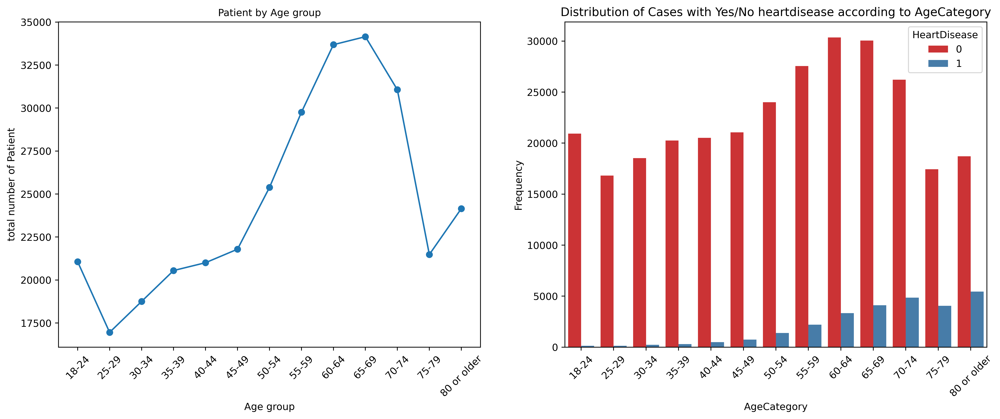

In [ ]:
age_plot = df.groupby(["AgeCategory"])
Patient_groupby_age= {}
for age, group in age_plot:
    Patient_groupby_age[age]=(group["AgeCategory"].count())


x_axis = np.arange(0, len(Patient_groupby_age.keys()) )
ageCategory_order =['18-24', '25-29', '30-34','35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74','75-79', '80 or older']

fig , axes= plt.subplots(1,2, figsize=(17,6),dpi=500)
ax=plt.subplot(1,2,1 )
ax0=plt.plot(x_axis, Patient_groupby_age.values(), marker="o")
ax.set_xticks(x_axis)
ax.set_xticklabels(ageCategory_order)
plt.title("Patient by Age group",size=10,)
plt.xlabel("Age group")
plt.ylabel("total number of Patient")
plt.xticks(rotation=45)





ax=plt.subplot(1,2,2 )
order = pd.unique(df.AgeCategory.values)
order.sort()
ax1=sns.countplot(data=df, x='AgeCategory', hue='HeartDisease', palette='Set1', order=order)
plt.title("Distribution of Cases with Yes/No heartdisease according to AgeCategory")
plt.xlabel('AgeCategory')
ax.set_xticks(x_axis)
ax.set_xticklabels(ageCategory_order)
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

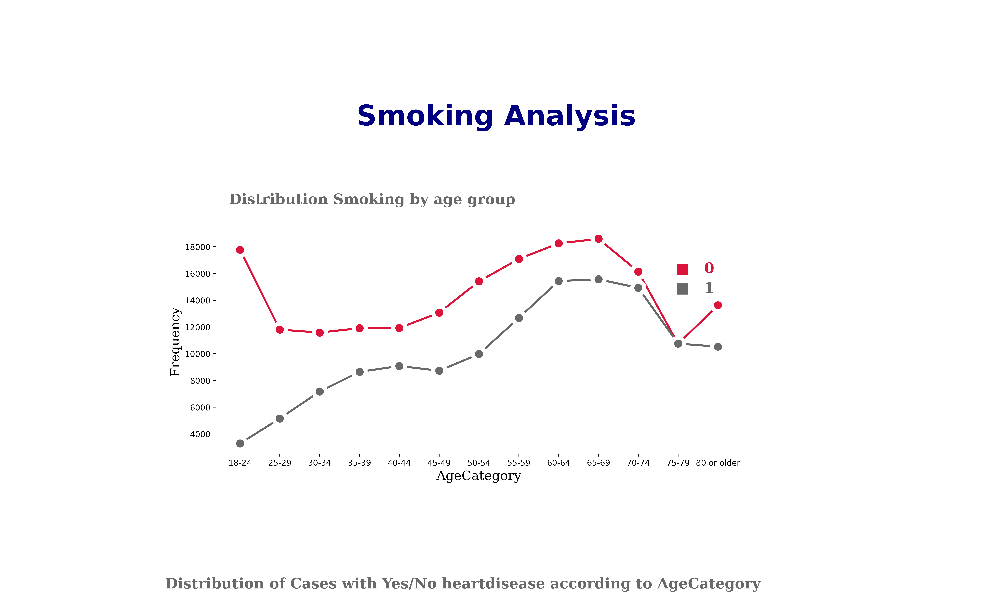

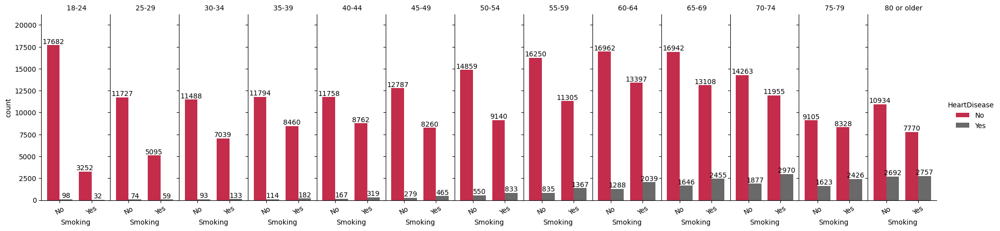

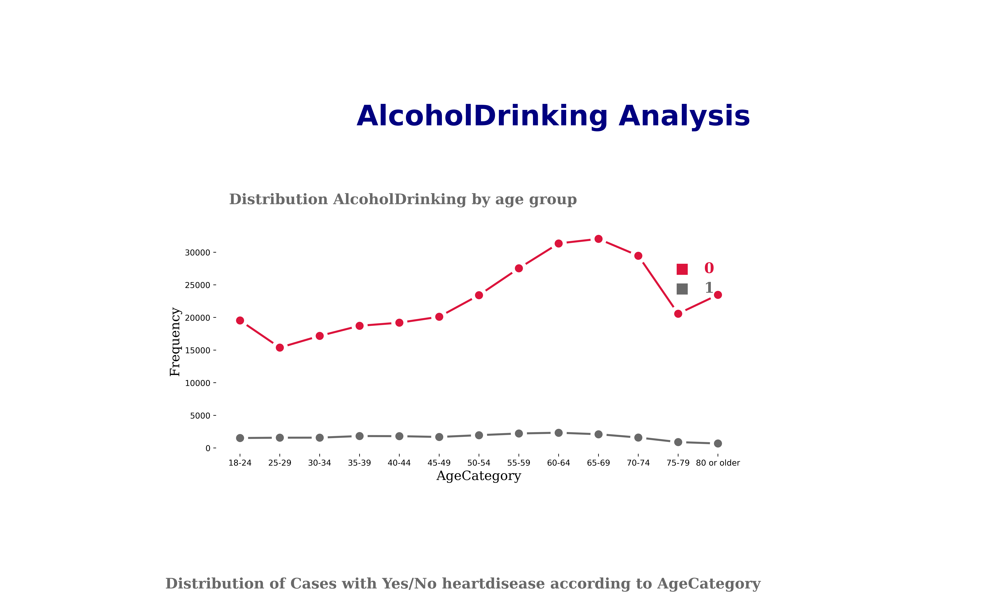

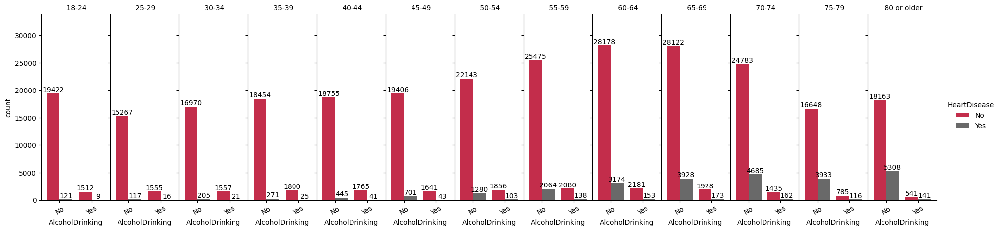

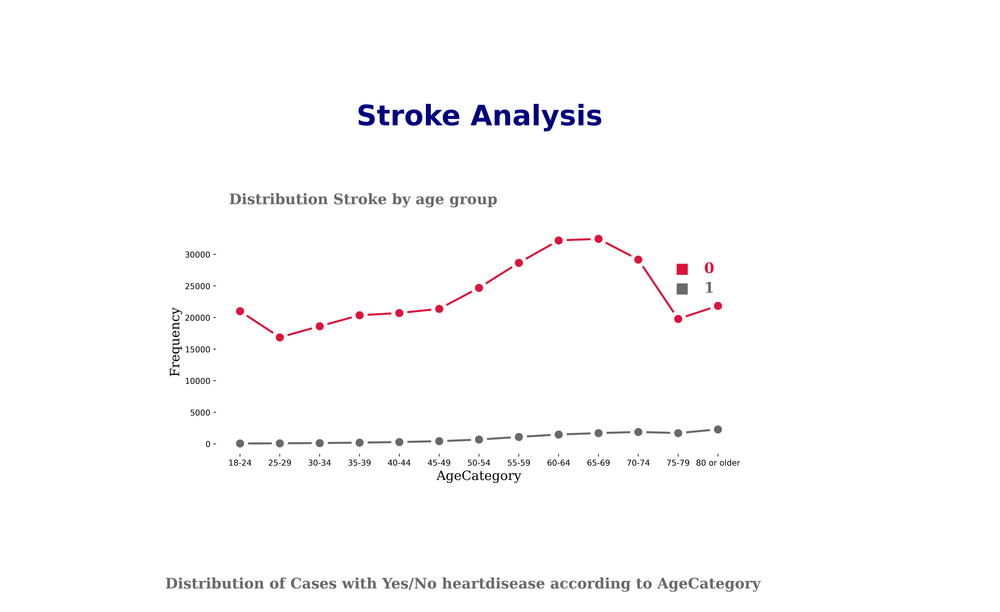

...

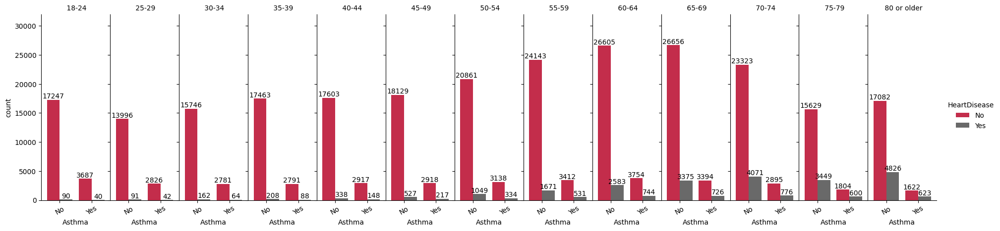

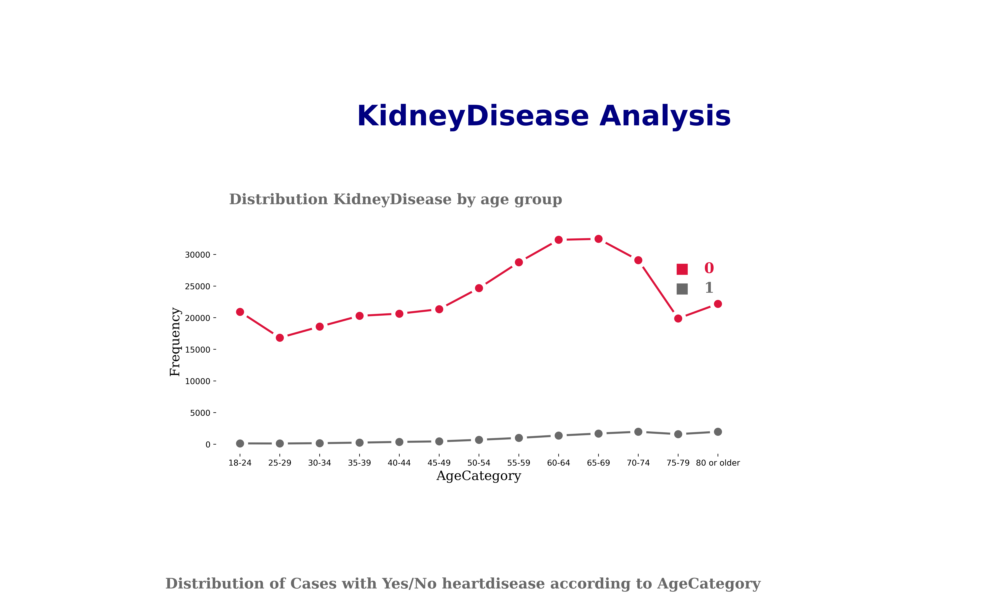

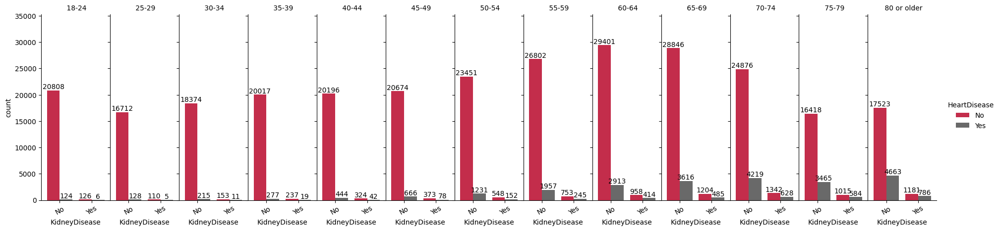

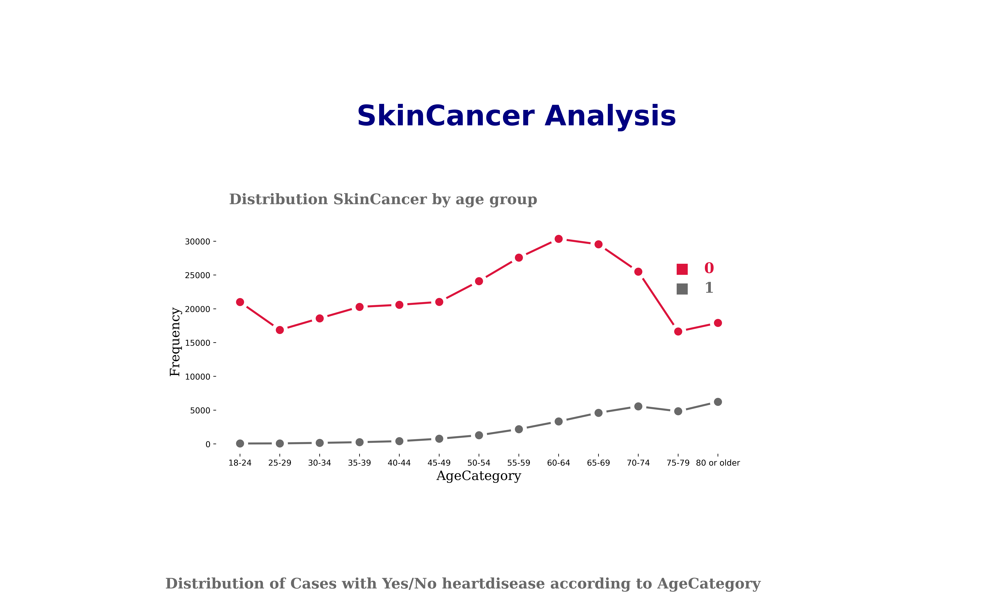

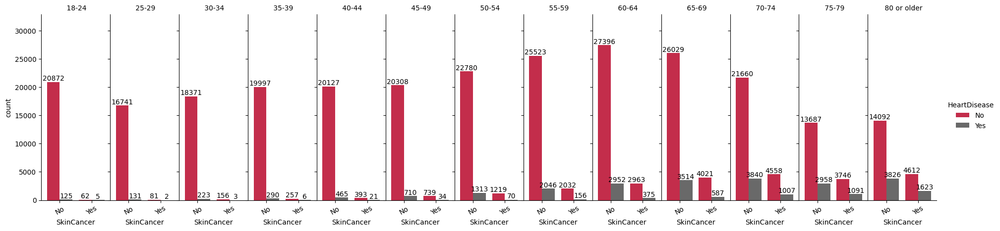

In [ ]:
color_catplot=["Crimson","DimGray"]
column_name=[ 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex','PhysicalActivity','Asthma', 'KidneyDisease', 'SkinCancer']
df_sorted=df_orginal.sort_values('AgeCategory')
X_tuple=tuple(tuple (x_axis))


for column in column_name:

    fig = plt.figure(figsize = (22,17),dpi=500)

    gs = fig.add_gridspec(10,24)
    gs.update(wspace = 1, hspace = 0.05)


    ax2 = fig.add_subplot(gs[0:3,5:18]) #distribution plot
    ax1 = fig.add_subplot(gs[4:5,0:]) #dumbbell plot

    # axes list
    axes = [ax1,ax2]

    # setting of axes; visibility of axes and spines turn off
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')

        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig.patch.set_facecolor('#FFFFFF')

    ax1.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(True)
    ax1.set_xlim(xmin = -250,xmax = 2000)
    ax1.set_ylim(ymin = -1,ymax =3.5)

    # catplot

    g=sns.catplot(x=column , hue="HeartDisease", col="AgeCategory",data=df_sorted,
                kind="count", height=5, aspect=.3, palette=color_catplot, ax=ax1)


    for ax in g.axes.flat[1:]:
        sns.despine(ax=ax, left=False)
    for ax in g.axes.flat:
        ax.set_xlabel(ax.get_title())
        ax.set_title('')
        ax.margins(x=0.1) # slightly more margin as a separation
        ax.tick_params(axis='x', labelrotation=30)
    for ax in g.axes.ravel():

        # add annotations
        for c in ax.containers:
            # add custom labels with the labels=labels parameter if needed
            # labels = [f'{h}' if (h := v.get_height()) > 0 else '' for v in c]
            ax.bar_label(c, label_type='edge')
        ax.margins(y=0.2)

        #title for each
    g.set_titles( col_template=' {col_name}')

    plt.subplots_adjust(wspace=0, bottom=0.18, left=0.06)

        #Remove lable form below of each
    g.set_xlabels()



    # lineplot
    column_plot_first =   df[df[column] == "0"]['AgeCategory'].value_counts().sort_index(axis = 0)
    column_plot_second= df[df[column] == "1"]['AgeCategory'].value_counts().sort_index(axis = 0)

    sns.lineplot( column_plot_first, marker="o", color="Crimson", linewidth = 2.5,ms=15,mew=5 ,ax = ax2)
    sns.lineplot( column_plot_second, marker="o", color="DimGray",linewidth = 2.5,ms=15,mew=5, ax = ax2)



    ax2.set_xlabel('AgeCategory', fontdict = {'font':'Serif', 'color': 'black', 'size': 16 })
    ax2.set_xticks(x_axis)
    ax2.set_xticklabels(ageCategory_order)
    ax2.set_ylabel('Frequency',fontdict = {'font':'Serif', 'color': 'black', 'size': 16})






    fig.text(0.4,0.985, column +" Analysis" ,{'font':'cursive', 'weight':'bold','color': 'Navy', 'size':35})
    fig.text(0.4, 1.1, " ")
    fig.text(0.65,0.835, '■   0 ', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"Crimson"})
    fig.text(0.65,0.815, '■   1', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})
    fig.text(0.3,0.905, 'Distribution '+column+' by age group', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})
    fig.text(0.25,0.515, 'Distribution of Cases with Yes/No heartdisease according to AgeCategory', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})

    fig.show()


In [ ]:
from sklearn.model_selection import  cross_val_score
# now you can import normally from model_selection
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.preprocessing import LabelEncoder


le = LabelEncoder()
df1 = df.copy(deep = True)


col = list(df.columns)
categorical_features = []
numerical_features = []
for i in df1.columns:
    if len(df[i].unique()) > 6:
        numerical_features.append(i)
    else:
        df1[i]=le.fit_transform(df1[i])
        categorical_features.append(i)

In [ ]:
X=df1.drop(['HeartDisease',"Race"], axis=1)
y=df1['HeartDisease']

In [ ]:
X_train , X_test, y_train,  y_test = train_test_split(X, y, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_ss=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_ss.fit(X_train_scaled,y_train)
y_pred_log=logreg_ss.predict(X_test_scaled)

y_pred_proba_log = logreg_ss.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


simple_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_simple"])

simple_log

,Logestic_regression_simple
Accuracy,0.913579
Precision,0.480226
Recall,0.142245
F1-score,0.219479
AUC,0.821515


In [ ]:
pip install -U imbalanced-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 257.7/257.7 kB 1.6 MB/s eta 0:00:00
  Attempting uninstall: imbalanced-learn
    Found existing installation: imbalanced-learn 0.10.1
    Uninstalling imbalanced-learn-0.10.1:
      Successfully uninstalled imbalanced-learn-0.10.1


Oversampling balances the number of samples between classes by adding an instance copy of an underrepresented class or by generating artificial data. We introduce three oversampling methods in addition to the three modified versions.


Random Oversampling involves supplementing the training data with multiple copies of some of the minority classes. Oversampling can be done more than once (2x, 3x, 5x, 10x, etc.) This is one of the earliest proposed methods, that is also proven to be robust. Instead of duplicating every sample in the minority class, some of them may be randomly chosen with replacement.


sampling_strategy='minority': :
This means that if the majority class had 1,000 examples and the minority class had 100, this strategy would oversampling the minority class so that it has 1,000 examples.

sampling_strategy=0.5: :
This means that if the majority class had 1,000 examples and the minority class had 100, the transformed dataset would have 500 examples of the minority class.


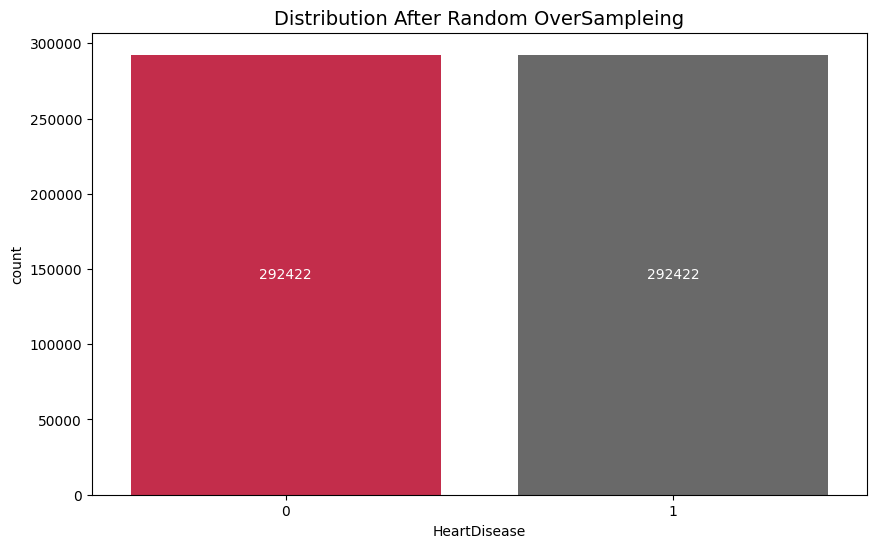

In [ ]:


from imblearn.over_sampling import RandomOverSampler
from collections import Counter

# define oversampling strategy
oversample = RandomOverSampler(sampling_strategy='minority')
#oversample = RandomOverSampler(sampling_strategy=0.5)

X_ROS, y_ROS = oversample.fit_resample(X, y)

plt.figure(figsize = (10,6))
ax=sns.countplot( x = y_ROS , palette=color_catplot,)
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution After Random OverSampleing", size=14)
plt.show()


In [ ]:
#model
X_train , X_test, y_train,  y_test = train_test_split(X_ROS, y_ROS, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_s=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_s.fit(X_train_scaled,y_train)
y_pred_log=logreg_s.predict(X_test_scaled)

y_pred_proba_log = logreg_s.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


ROS_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_ROS"])

ROS_log

,Logestic_regression_ROS
Accuracy,0.753283
Precision,0.760996
Recall,0.740288
F1-score,0.750499
AUC,0.833636


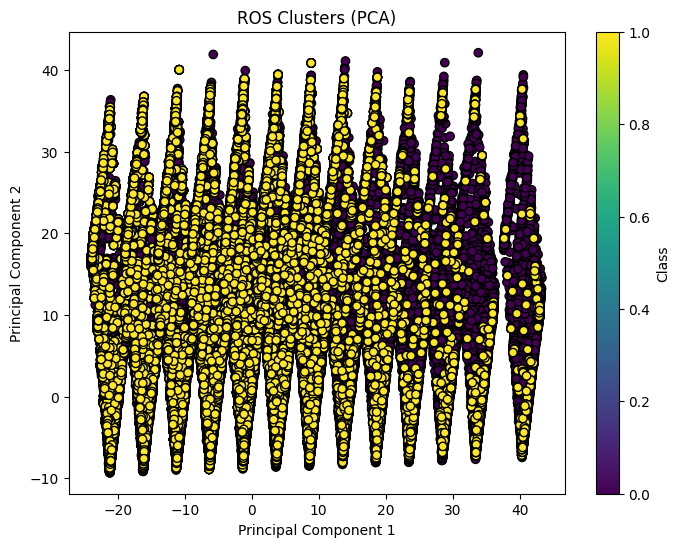

In [37]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Apply PCA to reduce the dimensionality of X_ROS
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_ROS)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_ROS, cmap='viridis', edgecolor='k')
plt.title('ROS Clusters (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Class')
plt.show()


SMOTE is an oversampling technique where the synthetic samples are generated for the minority class. This algorithm helps to overcome the overfitting problem posed by random oversampling.

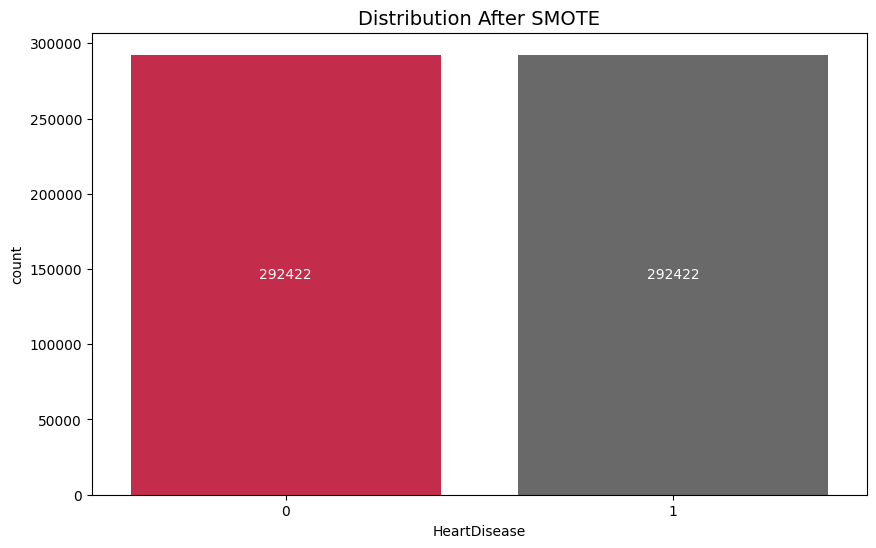

In [ ]:
from  imblearn.over_sampling import SMOTE

smote = SMOTE(n_jobs=-1, random_state=0)
X_smote, y_smote = smote.fit_resample(X, y)


plt.figure(figsize = (10,6))
ax=sns.countplot( x = y_smote , palette=color_catplot,)
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution After SMOTE", size=14)
plt.show()

In [ ]:

#model
X_train , X_test, y_train,  y_test = train_test_split(X_smote, y_smote, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_s=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_s.fit(X_train_scaled,y_train)
y_pred_log=logreg_s.predict(X_test_scaled)

y_pred_proba_log = logreg_s.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


Smote_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_Smote"])

Smote_log


,Logestic_regression_Smote
Accuracy,0.762912
Precision,0.756540
Recall,0.777061
F1-score,0.766663
AUC,0.841082


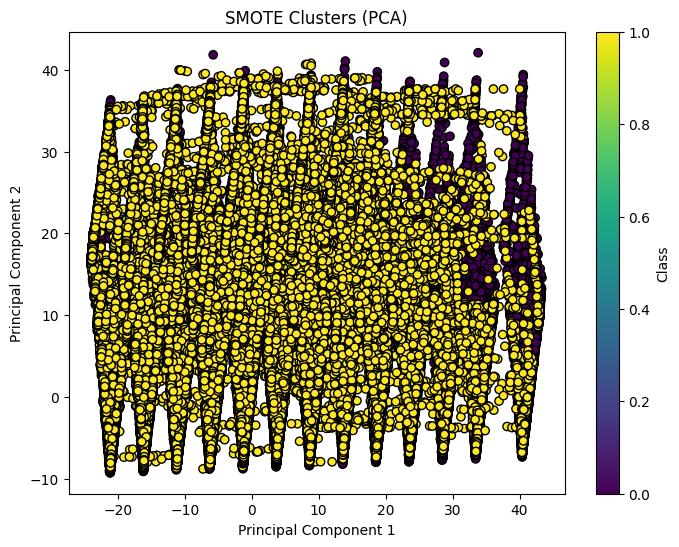

In [36]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Apply PCA to reduce the dimensionality of X_smote
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_smote)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_smote, cmap='viridis', edgecolor='k')
plt.title('SMOTE Clusters (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Class')
plt.show()


ADASYN is a generalized form of the SMOTE algorithm. This algorithm also aims to oversample the minority class by generating synthetic instances for it. But the difference here is it considers the density distribution, ri which decides the no. of synthetic instances generated for samples which difficult to learn. Due to this, it helps in adaptively changing the decision boundaries based on the samples difficult to learn. This is the major difference compared to SMOTE.


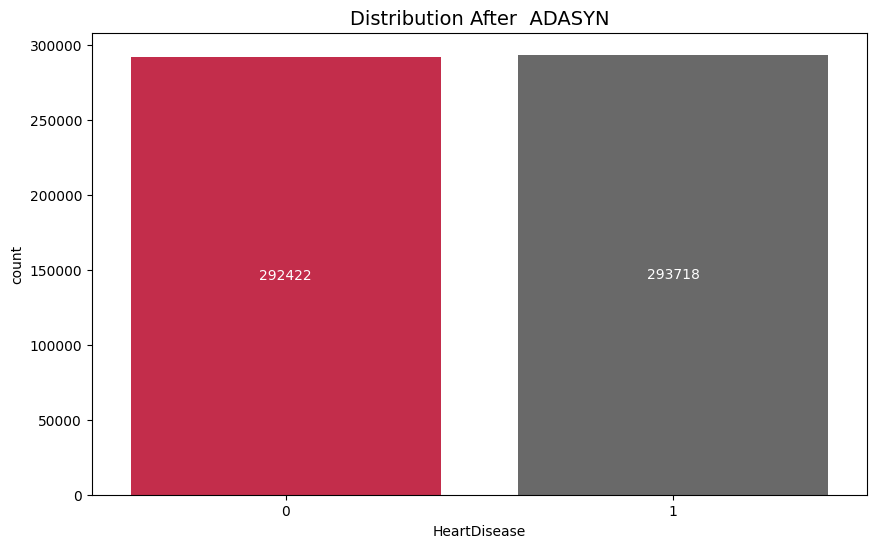

In [ ]:
from  imblearn.over_sampling import ADASYN

adasyn  = ADASYN (n_jobs=-1, random_state=0)
X_adasyn, y_adasyn = adasyn.fit_resample(X, y)


plt.figure(figsize = (10,6))
ax=sns.countplot( x = y_adasyn , palette=color_catplot,)
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution After  ADASYN", size=14)
plt.show()


In [ ]:
#model
X_train , X_test, y_train,  y_test = train_test_split(X_adasyn, y_adasyn, test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_s=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_s.fit(X_train_scaled,y_train)
y_pred_log=logreg_s.predict(X_test_scaled)

y_pred_proba_log = logreg_s.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


adasyn_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_adasyn"])

adasyn_log

,Logestic_regression_adasyn
Accuracy,0.752599
Precision,0.745659
Recall,0.769362
F1-score,0.757325
AUC,0.829753


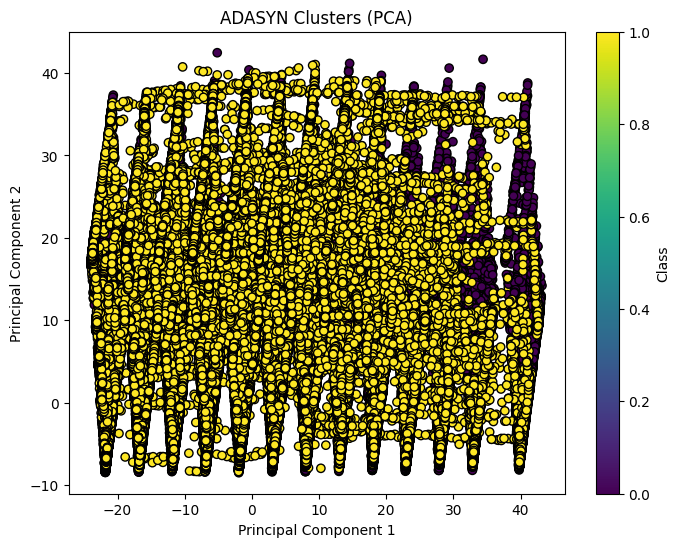

In [35]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Apply PCA to reduce the dimensionality of X_adasyn
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_adasyn)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_adasyn, cmap='viridis', edgecolor='k')
plt.title('ADASYN Clusters (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Class')
plt.show()


Borderline SMOTE is an improved oversampling algorithm based on SMOTE, which uses only a few class samples on the border to combine new samples, thus improving the sample category distribution.The number of majority neighbor of each minority instance is used to divide minority instances into 3 groups; SAFE/DANGER/NOISE, only the DANGER are used to generate synthetic instances.

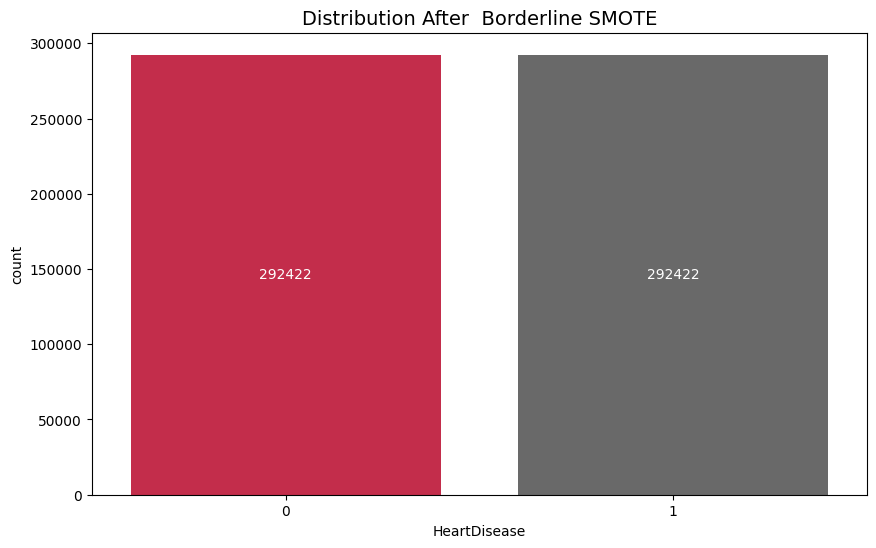

In [ ]:


from  imblearn.over_sampling import BorderlineSMOTE

Borderline_SMOTE  = BorderlineSMOTE ()
X_Borderline_SMOTE, y_Borderline_SMOTE = Borderline_SMOTE.fit_resample(X, y)


plt.figure(figsize = (10,6))
ax=sns.countplot( x = y_Borderline_SMOTE , palette=color_catplot,)
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution After  Borderline SMOTE", size=14)
plt.show()


In [ ]:
#model
X_train , X_test, y_train,  y_test = train_test_split(X_Borderline_SMOTE, y_Borderline_SMOTE , test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_s=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_s.fit(X_train_scaled,y_train)
y_pred_log=logreg_s.predict(X_test_scaled)

y_pred_proba_log = logreg_s.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


Borderline_SMOTE_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_Borderline"])

Borderline_SMOTE_log

,Logestic_regression_Borderline
Accuracy,0.791818
Precision,0.779087
Recall,0.816066
F1-score,0.797148
AUC,0.870122


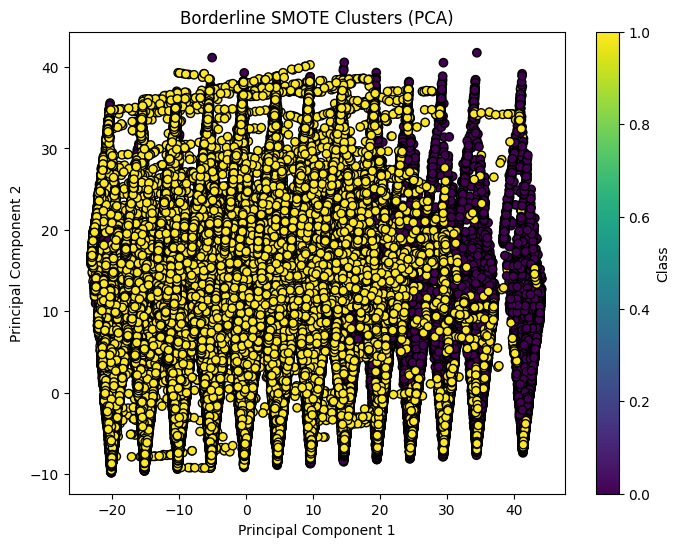

In [34]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Apply PCA to reduce the dimensionality of X_Borderline_SMOTE
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_Borderline_SMOTE)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_Borderline_SMOTE, cmap='viridis', edgecolor='k')
plt.title('Borderline SMOTE Clusters (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Class')
plt.show()


This is a fairly recent method and aims to reduce the noisy synthetic points that other oversampling methods generate. The way it works is fairly straightforward:

steps:

1_Do K-Means Clustering on the data.

2_Select clusters that have a high proportion (>50% or user-defined) of minority class samples.

3_Apply conventional SMOTE to these selected clusters. Each cluster will be assigned new synthetic points. The number of these generated points will depend on the sparsity of the minority class in the cluster; the more the sparsity, the more new points.

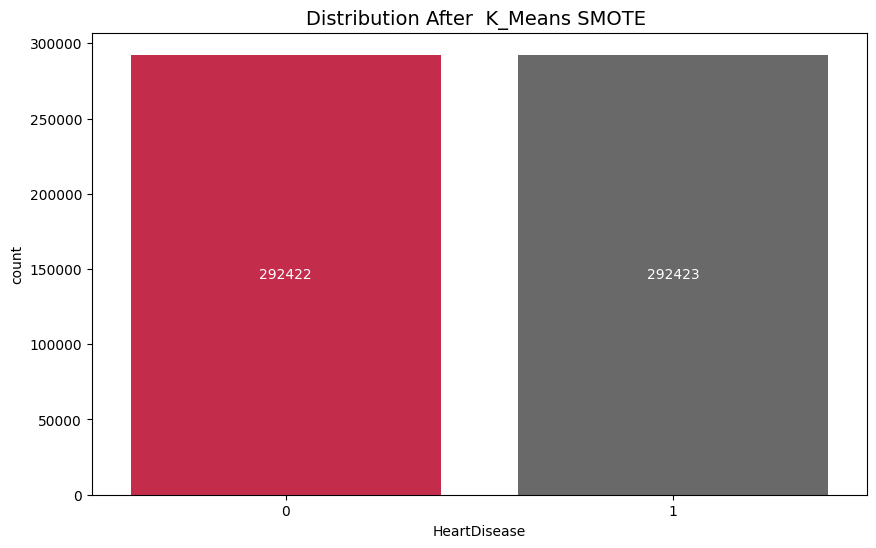

In [ ]:
from  imblearn.over_sampling import KMeansSMOTE

KSMOTE  = KMeansSMOTE(cluster_balance_threshold=0.1)
X_KSMOTE, y_KSMOTE = KSMOTE.fit_resample(X, y)


plt.figure(figsize = (10,6))
ax=sns.countplot( x = y_KSMOTE , palette=color_catplot,)
for container in ax.containers:
    ax.bar_label(container, label_type='center', rotation=0, color='white')
plt.title("Distribution After  K_Means SMOTE ", size=14)
plt.show()

In [ ]:
#model
X_train , X_test, y_train,  y_test = train_test_split(X_KSMOTE, y_KSMOTE , test_size=0.35, random_state=0)

scaler= StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_s=LogisticRegression(solver="liblinear", penalty="l2", C=0.00001, max_iter=10000)
logreg_s.fit(X_train_scaled,y_train)
y_pred_log=logreg_s.predict(X_test_scaled)

y_pred_proba_log = logreg_s.predict_proba(X_test_scaled)
fpr_log, tpr_log, _ = metrics.roc_curve(y_test, y_pred_proba_log[:,1])
auc_log = round(metrics.auc(fpr_log, tpr_log),5)


KSMOTE_log = pd.DataFrame(data=[accuracy_score(y_test, y_pred_log),
                                                                    precision_score(y_test, y_pred_log, average='binary'),
                                                                    recall_score(y_test, y_pred_log, average='binary'),
                                                                    f1_score(y_test, y_pred_log, average='binary'),
                                                                    roc_auc_score(y_test, y_pred_proba_log[:,1])],
                                                                    index=['Accuracy','Precision','Recall','F1-score','AUC'],
                                                                     columns = ["Logestic_regression_Ksmote"])

KSMOTE_log

,Logestic_regression_Ksmote
Accuracy,0.900511
Precision,0.900571
Recall,0.900633
F1-score,0.900602
AUC,0.952509


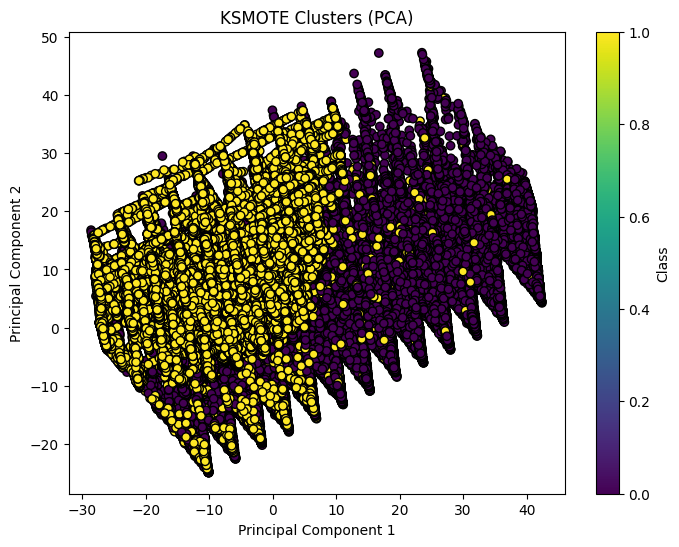

In [33]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Apply PCA to reduce the dimensionality of X_KSMOTE
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_KSMOTE)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_KSMOTE, cmap='viridis', edgecolor='k')
plt.title('KSMOTE Clusters (PCA)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.colorbar(label='Class')
plt.show()





**Conclusion**

Here's what can be inferred:

Accuracy: This metric measures the overall correctness of the model predictions. Higher accuracy indicates better performance in generalizing to unseen data.

Precision: Precision is the ratio of correctly predicted positive observations to the total predicted positives. It indicates the model's ability to avoid false positives.

Recall: Recall, also known as sensitivity or true positive rate, measures the ratio of correctly predicted positive observations to all actual positives. It indicates the model's ability to find all relevant cases within the data.

F1-score: The F1-score is the harmonic mean of precision and recall. It provides a balance between precision and recall and is useful when the classes are imbalanced.

AUC (Area Under the ROC Curve): AUC measures the model's ability to discriminate between positive and negative classes across different threshold values. A higher AUC indicates better overall performance.



The Logistic Regression model with KSMOTE has the highest values for all metrics, indicating better overall performance compared to the other resampling techniques.

The Simple Logistic Regression model has the highest accuracy but very low precision, recall, and F1-score, suggesting that it may not be the best model for this particular task.

Logistic Regression with Borderline, ADASYN, SMOTE, and ROS have relatively lower performance compared to KSMOTE but still show improvements over the simple logistic regression.

The choice of the best model depends on the specific goals of the task. If a balance between precision, recall, and overall accuracy is desired, the KSMOTE model appears to be the most suitable.